In [137]:
import numpy as np
import pandas as pd
from datetime import datetime
import matplotlib.pyplot as plt


In [138]:
inflation_data = pd.read_csv("../Data/prc_hicp_manr_tabular.tsv", sep=r'\,|\t', engine='python')

In [139]:
inflation_data.rename({'geo\TIME_PERIOD': "country"}, inplace=True, axis=1)

In [140]:
EU_inflation = inflation_data[(inflation_data.country=='EU') & (inflation_data.coicop=='CP00')]

In [141]:
EA_inflation = inflation_data[(inflation_data.country=='EA') & (inflation_data.coicop=='CP00')]

In [142]:
EA_inflation = EA_inflation.iloc[:,4:].transpose()
EU_inflation = EU_inflation.iloc[:,4:].transpose()

In [143]:
EA_inflation.columns = ['EA_inflation']
EU_inflation.columns = ['EU_inflation']

In [144]:
EA_inflation.index = [datetime.strptime(x.strip(), '%Y-%m') for x in EA_inflation.index]
EU_inflation.index = [datetime.strptime(x.strip(), '%Y-%m') for x in EU_inflation.index]


In [145]:
EA_inflation.EA_inflation = [np.nan  if x==':' or 'e' in x else np.float32(x) for x in EA_inflation.EA_inflation]
EU_inflation.EU_inflation = [np.nan  if x==':' or 'e' in x else np.float32(x) for x in EU_inflation.EU_inflation]

In [146]:
merged_inflation = pd.concat([EA_inflation,EU_inflation], axis=1)

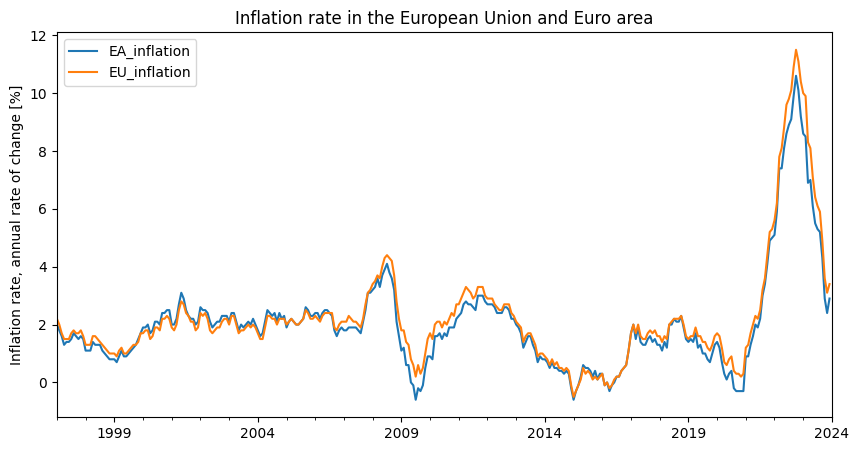

In [68]:
merged_inflation.plot(legend=None, figsize=(10,5))
plt.title("Inflation rate in the European Union and Euro area")
plt.ylabel("Inflation rate, annual rate of change [%]")
plt.legend()
plt.savefig('./plots/inflation_rate_EU.pdf')



In [174]:
deposit_rates = pd.read_csv("../Data/ECB_deposits_rates_households.csv")

In [175]:
deposit_rates.columns = ['Date', 'Period', 'rd']

In [176]:
del deposit_rates['Period']

In [177]:
deposit_rates.index = [datetime.strptime(x, '%Y-%m-%d') for x in deposit_rates.Date]

In [178]:
deposit_rates

,Date,rd
2000-01-31,2000-01-31,1.29
2000-02-29,2000-02-29,1.27
2000-03-31,2000-03-31,1.28
2000-04-30,2000-04-30,1.30
2000-05-31,2000-05-31,1.32
...,...,...
2023-08-31,2023-08-31,0.31
2023-09-30,2023-09-30,0.33
2023-10-31,2023-10-31,0.35
2023-11-30,2023-11-30,0.36


In [179]:
del deposit_rates['Date']

In [180]:
deposit_rates

,rd
2000-01-31,1.29
2000-02-29,1.27
2000-03-31,1.28
2000-04-30,1.30
2000-05-31,1.32
...,...
2023-08-31,0.31
2023-09-30,0.33
2023-10-31,0.35
2023-11-30,0.36


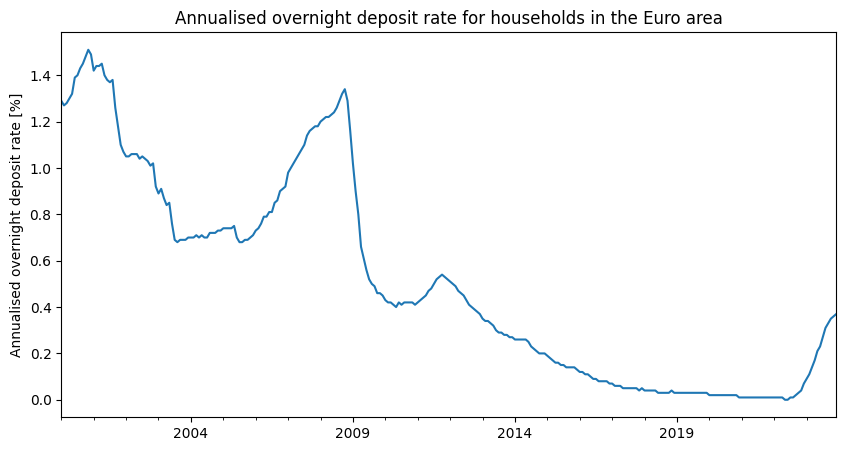

In [69]:
deposit_rates.plot(legend=None, figsize=(10,5))
plt.title("Annualised overnight deposit rate for households in the Euro area")
plt.ylabel("Annualised overnight deposit rate [%]")
plt.savefig('./plots/deposit_rate_EU.pdf')

In [181]:
deposit_rates_households_and_corporations = pd.read_csv("../Data/ECB_deposit_rates_household_and_corporations_aggregate.csv")

In [182]:
deposit_rates_households_and_corporations.columns = ['Date', 'Period', 'overnight_deposits','overnight_deposits_corporations','overnight_deposits_households']

In [183]:
del deposit_rates_households_and_corporations['Period'] 

In [184]:
deposit_rates_households_and_corporations.index = [datetime.strptime(x, '%Y-%m-%d') for x in deposit_rates_households_and_corporations.Date]

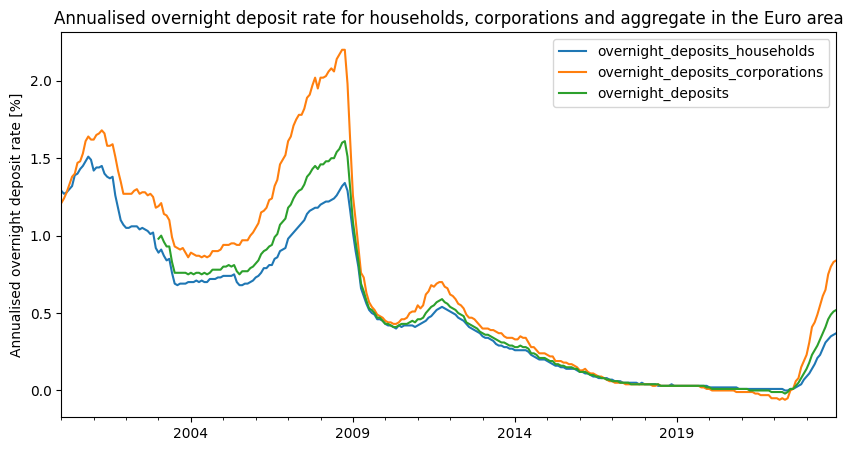

In [78]:
deposit_rates_households_and_corporations[['overnight_deposits_households','overnight_deposits_corporations','overnight_deposits']].plot(legend=None, figsize=(10,5))
plt.title("Annualised overnight deposit rate for households, corporations and aggregate in the Euro area")
plt.ylabel("Annualised overnight deposit rate [%]")
plt.legend()
plt.savefig('./plots/deposit_rate_EA_households_corporations.pdf')

# Quantity of depotis

In [2]:
quantity_deposits = pd.read_csv("../Data/data_deposits_quantity.csv")

In [5]:
set(quantity_deposits['Indicator title'])

{'From households - With an agreed maturity',
 'From households - With an agreed maturity - over 1 and up to 2yrs',
 'From households - With an agreed maturity - over 2yrs',
 'From households - With an agreed maturity - up to 1yr',
 'From non-financial corporations - With an agreed maturity',
 'From non-financial corporations - With an agreed maturity - over 1 and up to 2yrs',
 'From non-financial corporations - With an agreed maturity - over 2yrs',
 'From non-financial corporations - With an agreed maturity - up to 1yr',
 'Repos'}

## Households

In [45]:
household_deposits = [
'From households - With an agreed maturity - up to 1yr',    
'From households - With an agreed maturity - over 1 and up to 2yrs',
'From households - With an agreed maturity - over 2yrs',
 ]

corporations_deposits = [
'From non-financial corporations - With an agreed maturity - up to 1yr',    
'From non-financial corporations - With an agreed maturity - over 1 and up to 2yrs',
'From non-financial corporations - With an agreed maturity - over 2yrs',
 ]

In [46]:
mask_households = [True if x in household_deposits else False for x in quantity_deposits['Indicator title'] ]
mask_corporations = [True if x in corporations_deposits else False for x in quantity_deposits['Indicator title'] ]



In [17]:
quantity_deposits['Date'] = [datetime.strptime(x, '%Y-%m') for x in quantity_deposits['Obs. Date']]

In [21]:
import seaborn as sns

In [56]:
set(quantity_deposits[mask_households]['Indicator title'])

{'From households - With an agreed maturity - over 1 and up to 2yrs',
 'From households - With an agreed maturity - over 2yrs',
 'From households - With an agreed maturity - up to 1yr'}

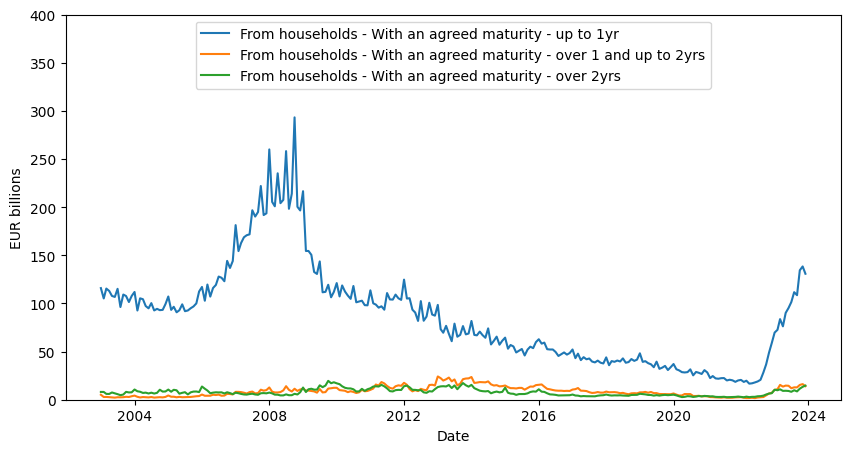

In [57]:
plt.figure(figsize=(10,5))
sns.lineplot(x="Date", y="Obs. value", hue='Indicator title', data=quantity_deposits[mask_households],
             hue_order=household_deposits)
plt.ylabel('EUR billions')
plt.legend(loc='upper center')
plt.ylim(0,400)
plt.savefig('./plots/deposit_quantity_agreed_maturity_households.pdf')

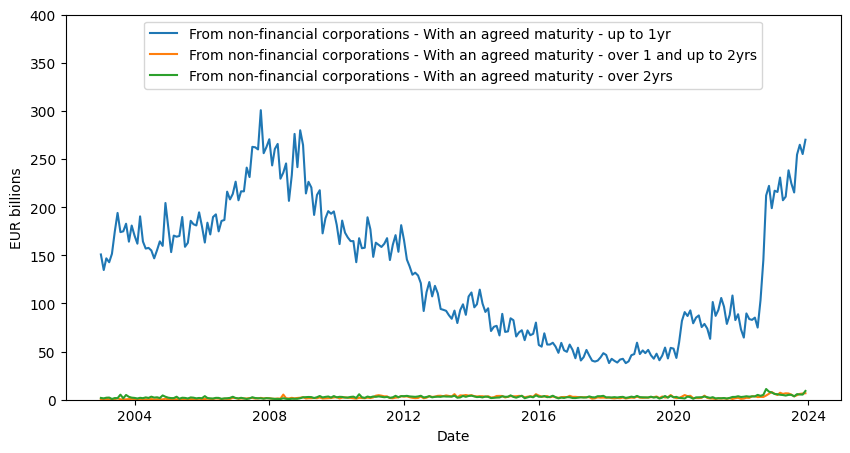

In [58]:
plt.figure(figsize=(10,5))
sns.lineplot(x="Date", y="Obs. value", hue='Indicator title', data=quantity_deposits[mask_corporations],
             hue_order=corporations_deposits)
plt.ylabel('EUR billions')
plt.legend(loc='upper center')
plt.ylim(0,400)
plt.savefig('./plots/deposit_quantity_agreed_maturity_corporations.pdf')

# Overnight deposits quantity

In [80]:
overnight_deposits_household = pd.read_csv("../Data/ECB Data Portal_overnight_deposits_households.csv")
overnight_deposits_corporations = pd.read_csv("../Data/ECB Data Portal_overnight_deposits_NFC.csv")

In [81]:
del overnight_deposits_household['TIME PERIOD']
del overnight_deposits_corporations['TIME PERIOD']

In [82]:
overnight_deposits_household.columns = ['DATE', 'Overnight deposits from households']
overnight_deposits_corporations.columns = ['DATE', 'Overnight deposits from corporations']

In [83]:
overnight_deposits_household.index = [datetime.strptime(x, '%Y-%m-%d') for x in overnight_deposits_household['DATE']]
overnight_deposits_corporations.index = [datetime.strptime(x, '%Y-%m-%d') for x in overnight_deposits_corporations['DATE']]

In [84]:
del overnight_deposits_household['DATE']
del overnight_deposits_corporations['DATE']

<AxesSubplot:>

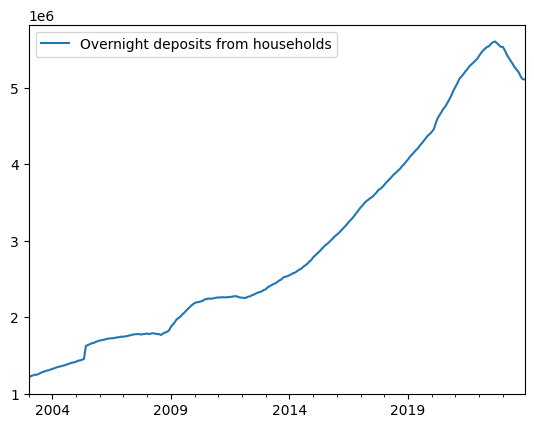

In [85]:
overnight_deposits_household.plot()

In [88]:
M1 = pd.read_csv("../Data/ECB Data Portal_M1.csv")


In [89]:
M1

,DATE,TIME PERIOD,"Monetary aggregate M1 reported by MFIs, central gov. and post office giro institutions in the euro area (stocks) (BSI.M.U2.Y.V.M10.X.1.U2.2300.Z01.E)"
0,1980-01-31,1980Jan,444330
1,1980-02-29,1980Feb,447116
2,1980-03-31,1980Mar,451370
3,1980-04-30,1980Apr,453226
4,1980-05-31,1980May,455917
...,...,...,...
523,2023-08-31,2023Aug,10543271
524,2023-09-30,2023Sep,10521387
525,2023-10-31,2023Oct,10404809
526,2023-11-30,2023Nov,10368888


In [90]:
del M1['TIME PERIOD']


In [91]:
M1.columns = ['DATE', 'M1']


In [92]:
M1.index = [datetime.strptime(x, '%Y-%m-%d') for x in M1['DATE']]


In [93]:
del M1['DATE']

<AxesSubplot:>

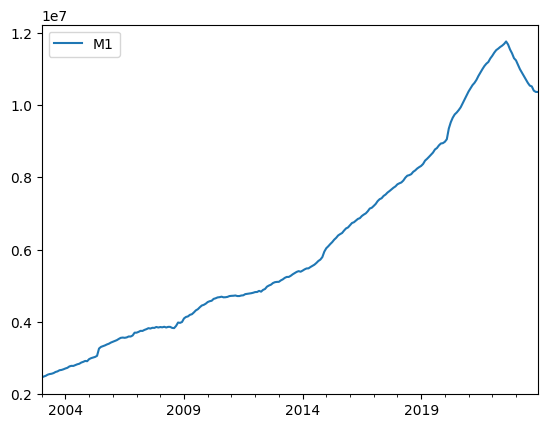

In [101]:
M1.loc[datetime.strptime('2003-01-01', '%Y-%m-%d'):].plot()

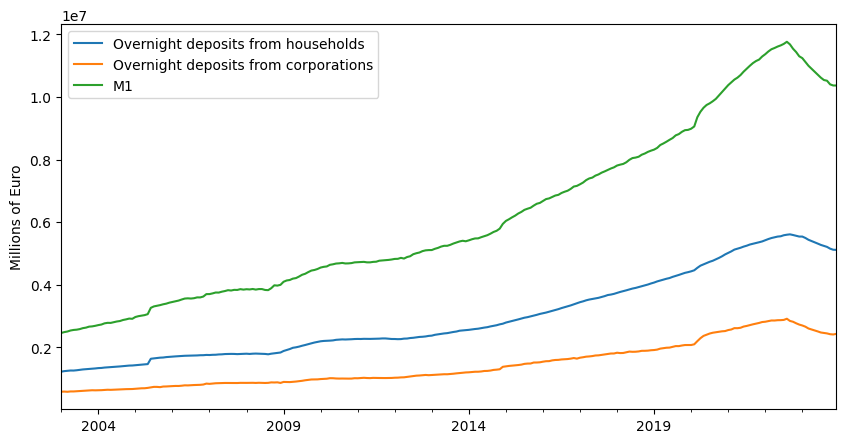

In [119]:
# plt.figure(figsize=(10,5))
pd.concat([overnight_deposits_household,overnight_deposits_corporations,M1.loc[datetime.strptime('2003-01-01', '%Y-%m-%d'):]],axis=1).plot(figsize=(10,5))
plt.ylabel('Millions of Euro')
plt.savefig('./plots/overnight_deposits_and_M1.pdf')


In [104]:
ratio_deposits_M1_households = overnight_deposits_household/M1.loc[datetime.strptime('2003-01-01', '%Y-%m-%d'):]

In [114]:
(overnight_deposits_household['Overnight deposits from households']/M1.loc[datetime.strptime('2003-01-01', '%Y-%m-%d'):]['M1']).describe()

count    252.000000
mean       0.477829
std        0.010711
min        0.453100
25%        0.468921
50%        0.478203
75%        0.485440
max        0.499926
dtype: float64

In [120]:
overnight_deposits_household['Overnight deposits from households']

2003-01-31    1215746
2003-02-28    1232736
2003-03-31    1241075
2003-04-30    1252125
2003-05-31    1250880
               ...   
2023-08-31    5237961
2023-09-30    5205947
2023-10-31    5149861
2023-11-30    5115058
2023-12-31    5111055
Name: Overnight deposits from households, Length: 252, dtype: int64

In [121]:
M1.loc[datetime.strptime('2003-01-01', '%Y-%m-%d'):]['M1']

2003-01-31     2454715
2003-02-28     2481185
2003-03-31     2499997
2003-04-30     2531994
2003-05-31     2549757
                ...   
2023-08-31    10543271
2023-09-30    10521387
2023-10-31    10404809
2023-11-30    10368888
2023-12-31    10367998
Name: M1, Length: 252, dtype: int64

In [357]:
ratios = pd.DataFrame()
ratios['overnight deposits/M1'] = (overnight_deposits_household['Overnight deposits from households']+overnight_deposits_corporations['Overnight deposits from corporations'])/M1.loc[datetime.strptime('2003-01-01', '%Y-%m-%d'):]['M1']
ratios['overnight deposits from households/M1'] = overnight_deposits_household['Overnight deposits from households']/M1.loc[datetime.strptime('2003-01-01', '%Y-%m-%d'):]['M1']
ratios['overnight deposits from corporations/M1'] = overnight_deposits_corporations['Overnight deposits from corporations']/M1.loc[datetime.strptime('2003-01-01', '%Y-%m-%d'):]['M1']

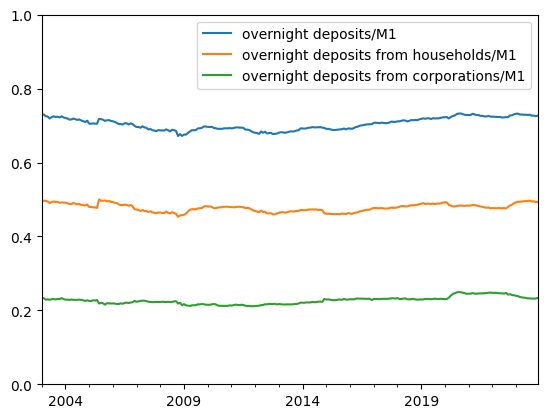

In [497]:
ratios.plot()
plt.ylim(0,1)
plt.savefig('./plots/ratio_overnight_deposits_M1_households_and_corporations.pdf')


# Prepare the data for the calibration: Inflation, ratio of cash/M1 and interest rate on deposits

In [359]:
calibration_data = pd.DataFrame()

In [360]:
calibration_data['inflation'] = merged_inflation['EA_inflation']

In [361]:
ratios.index= pd.to_datetime(pd.DataFrame({'day': 1, 
                                              'month': ratios.index.month, 
                                              'year': ratios.index.year},
                                              ))

In [362]:
calibration_data['cash/M1'] = 1-ratios[['overnight deposits/M1']]


In [363]:
calibration_data

,inflation,cash/M1
1997-01-01,2.0,NaN
1997-02-01,1.8,NaN
1997-03-01,1.6,NaN
1997-04-01,1.3,NaN
1997-05-01,1.4,NaN
...,...,...
2023-09-01,4.3,0.273409
2023-10-01,2.9,0.273068
2023-11-01,2.4,0.274755
2023-12-01,2.9,0.273332


In [364]:

deposit_rates_households_and_corporations.index= pd.to_datetime(pd.DataFrame({'day': 1, 
                                              'month': deposit_rates_households_and_corporations.index.month, 
                                              'year': deposit_rates_households_and_corporations.index.year},
                                              ))

In [365]:
calibration_data['overnight_deposit_rate_households'] = deposit_rates_households_and_corporations['overnight_deposits_households']/100
calibration_data['overnight_deposit_rate_corporations'] = deposit_rates_households_and_corporations['overnight_deposits_corporations']/100

In [366]:
calibration_data['inflation'] = calibration_data['inflation']/100

In [367]:
calibration_data

,inflation,cash/M1,overnight_deposit_rate_households,overnight_deposit_rate_corporations
1997-01-01,0.020,NaN,NaN,NaN
1997-02-01,0.018,NaN,NaN,NaN
1997-03-01,0.016,NaN,NaN,NaN
1997-04-01,0.013,NaN,NaN,NaN
1997-05-01,0.014,NaN,NaN,NaN
...,...,...,...,...
2023-09-01,0.043,0.273409,0.0033,0.0075
2023-10-01,0.029,0.273068,0.0035,0.0080
2023-11-01,0.024,0.274755,0.0036,0.0083
2023-12-01,0.029,0.273332,0.0037,0.0084


In [368]:
from scipy import optimize


In [369]:
import numerical_solutions

In [370]:
pi,r_d_observed,S_cash,S_deposit = (0.04,0.0033,0.5,0.5)

In [372]:
import importlib
importlib.reload(numerical_solutions)

<module 'numerical_solutions' from 'c:\\Users\\48515\\OneDrive\\Documents\\PhD\\Notebooks\\numerical_solutions.py'>

In [671]:
series_alphas = pd.Series(index=calibration_data[~calibration_data.isna().any(axis=1)].index,dtype=np.float64)
series_thetas = pd.Series(index=calibration_data[~calibration_data.isna().any(axis=1)].index,dtype=np.float64)

In [673]:
for index, row in calibration_data[~calibration_data.isna().any(axis=1)].iterrows():
    pi = row['inflation']
    r_d_observed = row['overnight_deposit_rate_households'] - pi# remember that this is a real interest rate, and the data is the nominal rate
    S_cash = row['cash/M1']
    optim  = optimize.minimize(fun=numerical_solutions.vector_objective_household,
                                x0=[.5,.99], 
                                args=(pi,r_d_observed,S_cash,1), 
                                method='Nelder-Mead',
                                bounds=[(0,1),(0,1)])

    alpha, theta = optim.x


    series_alphas.loc[index] = alpha
    series_thetas.loc[index] = theta

alpha 0.5
theta 0.99
pi 0.020999999046325685
r_d_observed -0.012099999046325685
S_cash 0.2705108332331859
S_deposit 0.7294891667668141
r_d is 0.04537664131088969
household_response {'x': 0.0703322528829346, 'y': 0.9296677471170655, 'z': -0.0}
alpha 0.525
theta 0.99
pi 0.020999999046325685
r_d_observed -0.012099999046325685
S_cash 0.2705108332331859
S_deposit 0.7294891667668141
r_d is 0.047411945478714204
household_response {'x': 0.07206911308151764, 'y': 0.9279308869184822, 'z': -0.0}
alpha 0.5
theta 1.0
pi 0.020999999046325685
r_d_observed -0.012099999046325685
S_cash 0.2705108332331859
S_deposit 0.7294891667668141
r_d is -5.07748821179719e+21
household_response {'x': -0.0, 'y': 1.0, 'z': -0.0}
alpha 0.5249999999999999
theta 0.98
pi 0.020999999046325685
r_d_observed -0.012099999046325685
S_cash 0.2705108332331859
S_deposit 0.7294891667668141
r_d is 0.07279078687073898
household_response {'x': 0.1024398053924019, 'y': 0.8975601946075972, 'z': -0.0}
alpha 0.5374999999999999
theta 0.9699

c:\Users\48515\OneDrive\Documents\PhD\Notebooks\numerical_solutions.py:25: RuntimeWarning: divide by zero encountered in double_scalars
  x = alpha * ( (theta/(1-theta))*(r_d+pi)+beta/y )**(-1)
c:\Users\48515\OneDrive\Documents\PhD\Notebooks\numerical_solutions.py:26: RuntimeWarning: divide by zero encountered in double_scalars
  z = gamma * ( (theta/(1-theta))*(r_d-i)+beta/y )**(-1)
c:\Users\48515\OneDrive\Documents\PhD\Notebooks\numerical_solutions.py:25: RuntimeWarning: invalid value encountered in multiply
  x = alpha * ( (theta/(1-theta))*(r_d+pi)+beta/y )**(-1)
c:\Users\48515\OneDrive\Documents\PhD\Notebooks\numerical_solutions.py:6: RuntimeWarning: divide by zero encountered in double_scalars
  x = alpha * ( (theta/(1-theta))*(r_d+pi)+beta/y )**(-1)
c:\Users\48515\OneDrive\Documents\PhD\Notebooks\numerical_solutions.py:7: RuntimeWarning: divide by zero encountered in double_scalars
  z = gamma * ( (theta/(1-theta))*(r_d-i)+beta/y )**(-1)


r_d is 0.14984183126895403
household_response {'x': 0.2061930057776637, 'y': 0.7938069942223362, 'z': -0.0}
alpha 0.5572265624999997
theta 0.9409374999999995
pi 0.020999999046325685
r_d_observed -0.012099999046325685
S_cash 0.2705108332331859
S_deposit 0.7294891667668141
r_d is 0.13386967470670091
household_response {'x': 0.18508812253657075, 'y': 0.8149118774634293, 'z': -0.0}
alpha 0.5304687499999995
theta 0.9312499999999997
pi 0.020999999046325685
r_d_observed -0.012099999046325685
S_cash 0.2705108332331859
S_deposit 0.7294891667668141
r_d is 0.13585578415935226
household_response {'x': 0.19584849142451918, 'y': 0.8041515085754809, 'z': -0.0}
alpha 0.4925781249999994
theta 0.9268749999999999
pi 0.020999999046325685
r_d_observed -0.012099999046325685
S_cash 0.2705108332331859
S_deposit 0.7294891667668141
r_d is 0.12845656574537342
household_response {'x': 0.19509540853196428, 'y': 0.8049045914680357, 'z': -0.0}
alpha 0.5148437499999994
theta 0.9162499999999998
pi 0.020999999046325685

(0.0, 1.0)

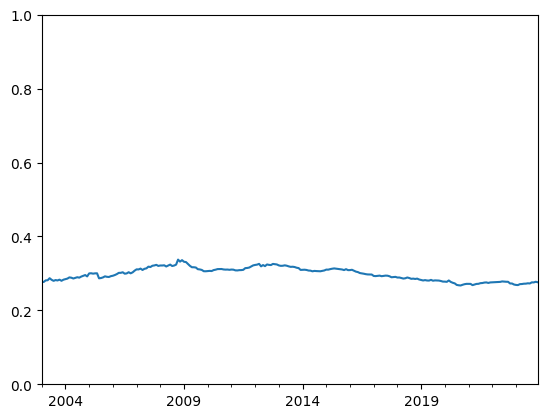

In [684]:
series_alphas.plot()
plt.ylim(0,1)

(0.0, 1.0)

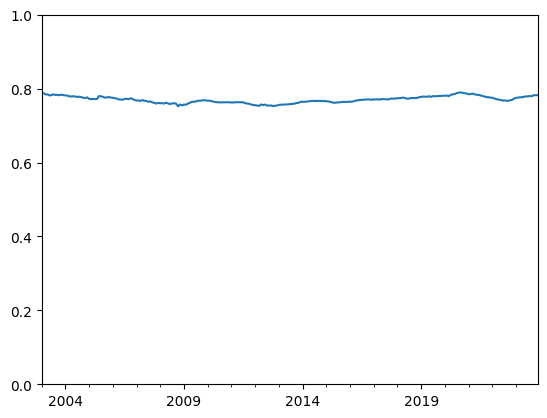

In [685]:
series_thetas.plot()
plt.ylim(0,1)

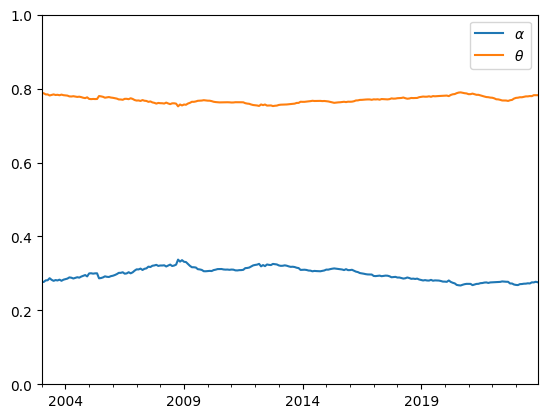

In [686]:
pd.concat([series_alphas.rename(r'$\alpha$'),series_thetas.rename(r'$\theta$')],axis=1).plot()
plt.ylim(0,1)
plt.savefig('./plots/alpha_theta_households.pdf')


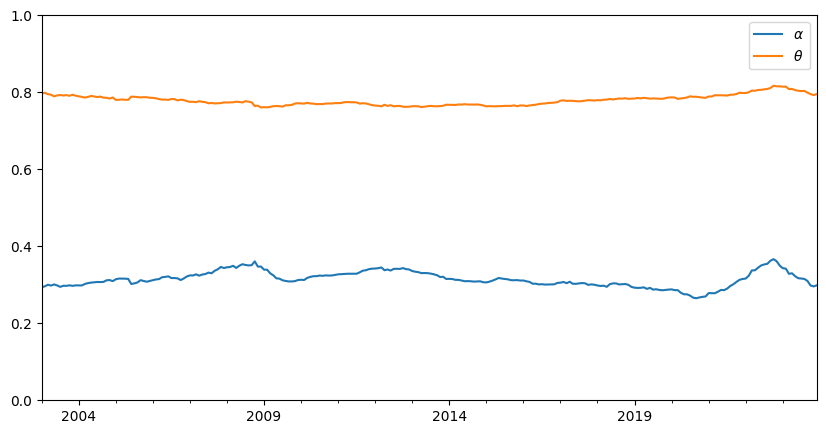

In [391]:
# This was wrong because was calibrated with nominal rates instead of real rates
pd.concat([series_alphas.rename(r'$\alpha$'),series_thetas.rename(r'$\theta$')],axis=1).plot(figsize=(10,5))
plt.ylim(0,1)
# plt.savefig('./plots/alpha_theta_households.pdf')


In [638]:
importlib.reload(numerical_solutions)

<module 'numerical_solutions' from 'c:\\Users\\48515\\OneDrive\\Documents\\PhD\\Notebooks\\numerical_solutions.py'>

In [639]:
series_alphas_corporations = pd.Series(index=calibration_data[~calibration_data.isna().any(axis=1)].index,dtype=np.float64)
series_thetas_corporations = pd.Series(index=calibration_data[~calibration_data.isna().any(axis=1)].index,dtype=np.float64)
r_L = 1


for index, row in calibration_data[~calibration_data.isna().any(axis=1)].iterrows():
    pi = row['inflation']
    r_d_observed = row['overnight_deposit_rate_corporations']
    S_cash = row['cash/M1']
    optim  = optimize.minimize(fun=numerical_solutions.vector_objective_household,
                                x0=[.5,.99], 
                                args=(pi,r_d_observed,S_cash,r_L), 
                                method='Nelder-Mead',
                                bounds=[(0,1),(0,1)])

    alpha, theta = optim.x


    series_alphas_corporations.loc[index] = alpha
    series_thetas_corporations.loc[index] = theta

alpha 0.5
theta 0.99
pi 0.020999999046325685
r_d_observed 0.011899999999999999
S_cash 0.2705108332331859
S_deposit 0.7294891667668141
r_d is 0.04537664131088969
household_response {'x': 0.0703322528829346, 'y': 0.9296677471170655, 'z': -0.0}
alpha 0.525
theta 0.99
pi 0.020999999046325685
r_d_observed 0.011899999999999999
S_cash 0.2705108332331859
S_deposit 0.7294891667668141
r_d is 0.047411945478714204
household_response {'x': 0.07206911308151764, 'y': 0.9279308869184822, 'z': -0.0}
alpha 0.5
theta 1.0
pi 0.020999999046325685
r_d_observed 0.011899999999999999
S_cash 0.2705108332331859
S_deposit 0.7294891667668141
r_d is -5.07748821179719e+21
household_response {'x': -0.0, 'y': 1.0, 'z': -0.0}
alpha 0.5249999999999999
theta 0.98
pi 0.020999999046325685
r_d_observed 0.011899999999999999
S_cash 0.2705108332331859
S_deposit 0.7294891667668141
r_d is 0.07279078687073898
household_response {'x': 0.1024398053924019, 'y': 0.8975601946075972, 'z': -0.0}
alpha 0.5374999999999999
theta 0.96999999

(0.0, 1.0)

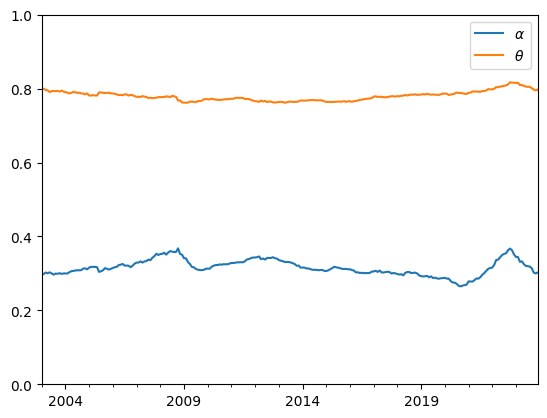

In [640]:
pd.concat([series_alphas_corporations.rename(r'$\alpha$'),series_thetas_corporations.rename(r'$\theta$')],axis=1).plot()
plt.ylim(0,1)

(0.0, 1.0)

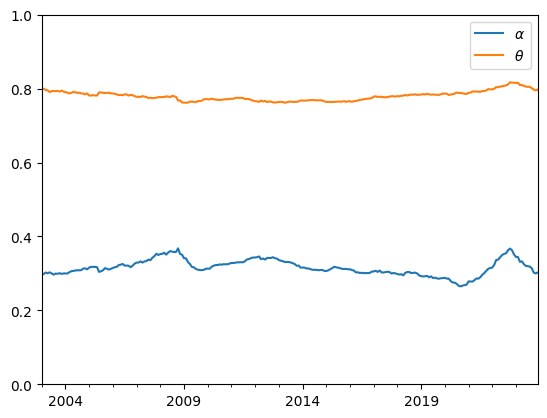

In [437]:
pd.concat([series_alphas_corporations.rename(r'$\alpha$'),series_thetas_corporations.rename(r'$\theta$')],axis=1).plot(figsize=(6.4,4.8))
plt.ylim(0,1)
# plt.savefig('./plots/alpha_theta_corporations.pdf')


In [683]:
series_thetas

2003-01-01    0.787571
2003-02-01    0.787458
2003-03-01    0.784229
2003-04-01    0.784243
2003-05-01    0.781379
                ...   
2023-08-01    0.779822
2023-09-01    0.779546
2023-10-01    0.782190
2023-11-01    0.782006
2023-12-01    0.782119
Length: 252, dtype: float64

In [380]:
series_thetas_corporations

2003-01-01    0.798575
2003-02-01    0.799847
2003-03-01    0.796359
2003-04-01    0.795111
2003-05-01    0.790497
                ...   
2023-08-01    0.805137
2023-09-01    0.800998
2023-10-01    0.797397
2023-11-01    0.794956
2023-12-01    0.797379
Length: 252, dtype: float64

In [383]:
series_alphas

2003-01-01    0.293673
2003-02-01    0.295956
2003-03-01    0.300097
2003-04-01    0.297993
2003-05-01    0.300902
                ...   
2023-08-01    0.315127
2023-09-01    0.310008
2023-10-01    0.298137
2023-11-01    0.295774
2023-12-01    0.298556
Length: 252, dtype: float64

In [626]:
series_alphas_corporations

2003-01-01    0.582819
2003-02-01    0.590317
2003-03-01    0.590638
2003-04-01    0.592066
2003-05-01    0.629560
                ...   
2023-08-01    0.641298
2023-09-01    0.632525
2023-10-01    0.624882
2023-11-01    0.590962
2023-12-01    0.623071
Length: 252, dtype: float64

In [641]:
row = calibration_data[~calibration_data.isna().any(axis=1)].iloc[-1]

In [642]:
row

inflation                              0.029000
cash/M1                                0.273332
overnight_deposit_rate_households      0.003700
overnight_deposit_rate_corporations    0.008400
Name: 2023-12-01 00:00:00, dtype: float64

In [643]:
pi = row['inflation']
r_d_observed = row['overnight_deposit_rate_corporations']
S_cash = row['cash/M1']

In [644]:
alpha = series_alphas_corporations.iloc[-1]
theta = series_thetas_corporations.iloc[-1]

In [646]:
best_response_commercial_bank(pi=pi,i=99,alpha=alpha,beta=1-alpha,gamma=0,theta=theta,r_L=1)

0.008382834900916281

In [613]:
best_response_commercial_bank(pi=pi,i=99,alpha=alpha,beta=1-alpha,gamma=0,theta=theta)

0.07070225433159708

In [647]:
numerical_solutions.best_response_household(r_d_observed,pi,99,alpha,1-alpha,0,theta)['x']

0.27333373737170197

In [687]:
series_rd_predicted = pd.Series(index=calibration_data[~calibration_data.isna().any(axis=1)].index,dtype=np.float64)
series_x_predicted = pd.Series(index=calibration_data[~calibration_data.isna().any(axis=1)].index,dtype=np.float64)


for index, row in calibration_data[~calibration_data.isna().any(axis=1)].iterrows():
    pi = row['inflation']
    # r_d_observed = row['overnight_deposit_rate_households'] - pi
    # S_cash = row['cash/M1']
    
    alpha = series_alphas.loc[index]
    theta = series_thetas.loc[index]

    predicted_rd = numerical_solutions.best_response_commercial_bank(pi=pi,i=99,alpha=alpha,beta=1-alpha,gamma=0,theta=theta)
    series_rd_predicted.loc[index] = predicted_rd

    series_x_predicted.loc[index] = numerical_solutions.best_response_household(predicted_rd,pi,99,alpha,1-alpha,0,theta)['x']


In [688]:
calibration_data[~calibration_data.isna().any(axis=1)]

,inflation,cash/M1,overnight_deposit_rate_households,overnight_deposit_rate_corporations
2003-01-01,0.021,0.270511,0.0089,0.0119
2003-02-01,0.024,0.270091,0.0091,0.0121
2003-03-01,0.024,0.274794,0.0087,0.0114
2003-04-01,0.021,0.275377,0.0084,0.0113
2003-05-01,0.018,0.280826,0.0085,0.0110
...,...,...,...,...
2023-08-01,0.052,0.270587,0.0031,0.0065
2023-09-01,0.043,0.273409,0.0033,0.0075
2023-10-01,0.029,0.273068,0.0035,0.0080
2023-11-01,0.024,0.274755,0.0036,0.0083


In [689]:
# predicted share x and observed

In [690]:
# plt.rcParams["font.family"] = "Times New Roman"

# params = {'font.size' : 12,
#           'font.family' : 'Times New Roman',
#           }
# plt.rcParams.update(params) 

In [691]:
from matplotlib import interactive

interactive(True)


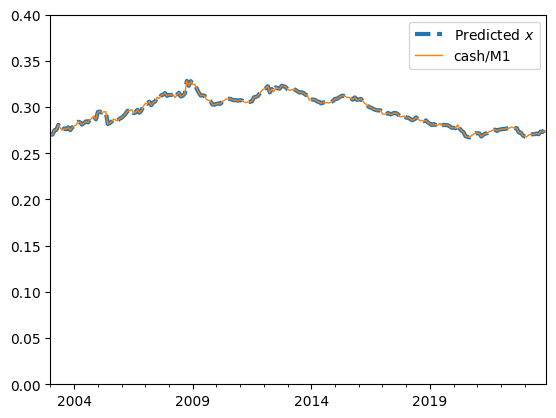

In [692]:
plot=pd.concat([series_x_predicted.rename('Predicted $x$'),calibration_data[~calibration_data.isna().any(axis=1)]['cash/M1']],axis=1).plot(ylim=(0,.4))
lws = [3, 1]
styles = ['dashed', 'solid']

for i, l in enumerate(plot.lines):
    plt.setp(l, linewidth=lws[i])
    plt.setp(l, linestyle=styles[i])

plt.legend()
# plt.show()
plt.savefig('./plots/x_cash_ratio_predicted_and_observed_households.pdf')

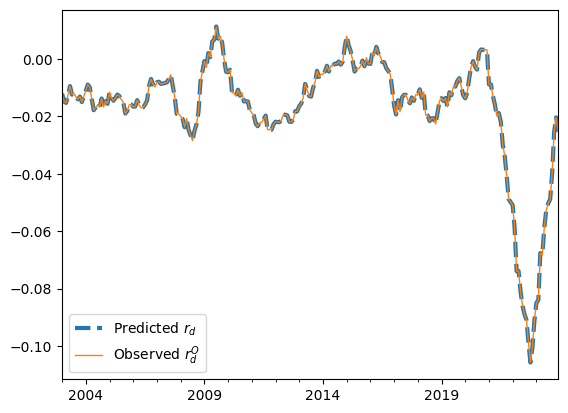

In [709]:
plot=pd.concat([series_rd_predicted.rename('Predicted $r_d$'),
(calibration_data[~calibration_data.isna().any(axis=1)]['overnight_deposit_rate_households']-calibration_data[~calibration_data.isna().any(axis=1)]['inflation']).rename('Observed $r_d^O$')],axis=1).plot()
lws = [3, 1]
styles = ['dashed', 'solid']

for i, l in enumerate(plot.lines):
    plt.setp(l, linewidth=lws[i])
    plt.setp(l, linestyle=styles[i])

plt.legend()

plt.savefig('./plots/r_d_predicted_and_observed_households.pdf')

### Case with CBDC

In [591]:
importlib.reload(numerical_solutions)

<module 'numerical_solutions' from 'c:\\Users\\48515\\OneDrive\\Documents\\PhD\\Notebooks\\numerical_solutions.py'>

In [697]:
pi

0.029000000953674318

In [704]:
alpha

0.2760241421987967

In [705]:
theta

0.7821193644577901

# Case CBDC similar to cash

In [727]:
r_z = numerical_solutions.best_response_central_bank(pi=pi,
                                                    alpha=alpha/2,
                                                    beta=1-alpha,
                                                    gamma=alpha/2,
                                                    theta=theta,
                                                    r_L_CB=1,
                                                    r_L=1)
r_z

0.1683868753494685

In [728]:
numerical_solutions.best_response_commercial_bank(pi=pi,i=99,alpha=alpha,beta=1-alpha,gamma=0,theta=theta,r_L=1)




-0.02526690795066145

In [729]:
r_d_with_CBDC = numerical_solutions.best_response_commercial_bank(pi=pi,i=r_z,alpha=alpha/2,beta=1-alpha,gamma=alpha/2,theta=theta)
r_d_with_CBDC

0.0929305862469702

In [730]:
import numpy as np

In [731]:
pi

0.029000000953674318

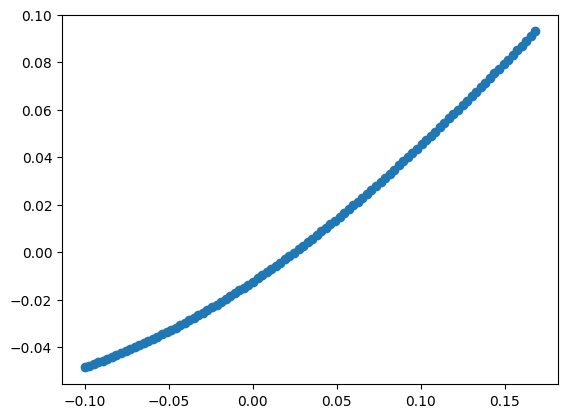

In [732]:
rates_r_z = np.linspace(-.1,r_z,100)

plt.scatter(rates_r_z,pd.Series([numerical_solutions.best_response_commercial_bank(pi=pi,i=r_z,alpha=alpha/2,beta=1-alpha,gamma=alpha/2,theta=theta) for r_z in rates_r_z]).rename('r_d'))

In [569]:
0.12228806478198045/0.0037155698090772732-1

31.912331369262994

#### baseline case

In [733]:
numerical_solutions.best_response_household(predicted_rd,pi,99,alpha,1-alpha,0,theta)

{'x': 0.2733623155006874, 'y': 0.7266376844993127, 'z': -0.0}

#### with CBDC similar to cash

In [734]:
numerical_solutions.best_response_household(r_d=r_d_with_CBDC,pi=pi,i=r_z,alpha=alpha/2,beta=1-alpha,gamma=alpha/2,theta=theta)

{'x': 0.09540550648409066, 'y': 0.7175939607424399, 'z': 0.18700053277346962}

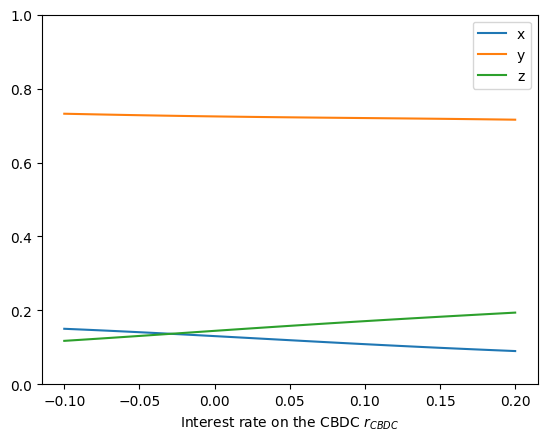

In [750]:
rates_r_z = np.linspace(-.1,.2,100)
pd.DataFrame([numerical_solutions.best_response_household(r_d=numerical_solutions.best_response_commercial_bank(pi=pi,
                                                                i=r_z,
                                                                alpha=alpha/2,
                                                                beta=1-alpha,
                                                                gamma=alpha/2,
                                                                theta=theta),
                                                        pi=pi,
                                                        i=r_z,
                                                        alpha=alpha/2,
                                                        beta=1-alpha,
                                                        gamma=alpha/2,
                                                        theta=theta) for r_z in rates_r_z],index=rates_r_z).plot(ylim=(0,1))
plt.xlabel('Interest rate on the CBDC $r_{CBDC}$')
plt.savefig('./plots/calibration_case_similar_to_cash.pdf')

# Case similar to Commercial Bank deposits

In [720]:
numerical_solutions.best_response_central_bank

<function numerical_solutions.best_response_central_bank(pi, alpha, beta, gamma, theta, r_L_CB=1, r_L=1)>

In [721]:
r_z = numerical_solutions.best_response_central_bank(pi=pi,
                                                    alpha=alpha,
                                                    beta=(1-alpha)/2,
                                                    gamma=(1-alpha)/2,
                                                    theta=theta, 
                                                    r_L_CB=1,
                                                    r_L=1)
r_z

0.10472816506511315

In [724]:
r_d_with_CBDC = numerical_solutions.best_response_commercial_bank(pi=pi,
                                                                i=r_z,
                                                                alpha=alpha,
                                                                beta=(1-alpha)/2,
                                                                gamma=(1-alpha)/2,
                                                                theta=theta)
r_d_with_CBDC

0.2915436878712

In [752]:
pi

0.029000000953674318

In [725]:
numerical_solutions.best_response_household(r_d=r_d_with_CBDC,
                                            pi=pi,
                                            i=r_z,
                                            alpha=alpha,
                                            beta=(1-alpha)/2,
                                            gamma=(1-alpha)/2,
                                            theta=theta)

{'x': 0.15444213153521597, 'y': 0.5686379599395559, 'z': 0.2769199085252282}

In [737]:
theta

0.7821193644577901

In [736]:
alpha

0.2760241421987967

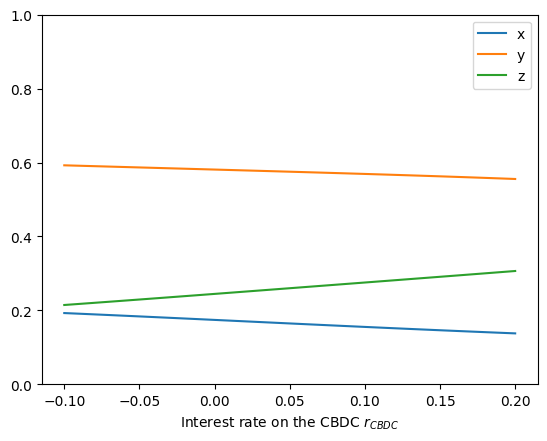

In [751]:
rates_r_z = np.linspace(-.1,.2,100)
pd.DataFrame([numerical_solutions.best_response_household(r_d=numerical_solutions.best_response_commercial_bank(pi=pi,
                                                                i=r_z,
                                                                alpha=alpha,
                                                                beta=(1-alpha)/2,
                                                                gamma=(1-alpha)/2,
                                                                theta=theta),
                                                        pi=pi,
                                                        i=r_z,
                                                        alpha=alpha,
                                                        beta=(1-alpha)/2,
                                                        gamma=(1-alpha)/2,
                                                        theta=theta) for r_z in rates_r_z],index=rates_r_z).plot(ylim=(0,1))
plt.xlabel('Interest rate on the CBDC $r_{CBDC}$')
plt.savefig('./plots/calibration_case_similar_to_deposits.pdf')